# Check all label of check label of 332 images
* its seems not correct label in image 15.jpg
* plot ans save all label with image to check 

    [done]2021-10-01 Check coco json label/box. make sure input the [] array type of ids.
    

category = [WormEat, Mold, Defecation, Brown, Stains]
category = [蟲蛀, 黴菌, 生物排遺, 褐斑, 水漬]
category = [1, 2, 3, 4, 5]


In [ ]:
# !pip install scikit-image

In [1]:
#Head of the head
import numpy as np
import matplotlib.pyplot as plt
# from matplotlib.patches import Rectangle
import pylab
import skimage.io as io
# import os
import cv2
#JACK
import datetime
#COCO API
from pycocotools.coco import COCO


#Parameters
#Plt figure size
pylab.rcParams['figure.figsize'] = (16.0, 20.0)
#cv2.putText
font = cv2.FONT_HERSHEY_SIMPLEX
#org
org = (50, 50)
#fontScale
fontScale = 3
#Blue color in BGR
color = (255, 0, 0)
#Blue color in BGR
color_blue = (255, 0, 0)
# Line thickness of 2 px
thickness = 2

#Util function
def get_date():
    date= datetime.datetime.today()
    return date.strftime("%Y_%m_%d_%H%M")

## wrong usage for coco api ids given and taken.

In [ ]:
annotations_file='/home/u3148947/data/nmtl/train_redo_ids_Eng.json'
# annotations_file='/home/u3148947/data/nmtl/train.json'
coco=COCO(annotations_file)
# display COCO categories and supercategories
cats = coco.loadCats(coco.getCatIds())
nms=[cat['name'] for cat in cats]
print('COCO categories: \n{}\n'.format(' '.join(nms)))
nms = set([cat['supercategory'] for cat in cats])
print('COCO supercategories: \n{}'.format(' '.join(nms)))


#check length of coco ImgIds
imgIds = coco.getImgIds()#A list of id
# print(f'imgIds: {imgIds}')
print("Total images: ", len(imgIds))

## user give ids
give_id = 0 # str(300) # or '0'
print(f'give_id: {give_id}')

# img_info = coco.loadImgs(give_id)[0]
img_infos = coco.loadImgs(imgIds)#A list of {'id': , 'width': , 'height': , 'license': , 'file_name': }


# for nu_of_images in range(len(imgIds)):
for nu_of_images in range(140, 151):
    
    img_info = img_infos[nu_of_images]# where, the (img_infos)[give_id], give_id is indicte the image id want to get

    img_id = img_info['id']
    img_name = img_info['file_name']
    print(f'img_id: {img_id}')
    #print(f'img_info: {img_info}')
    #print(f'image name: {img_name}')

    img =  cv2.imread("/home/u3148947/data/nmtl/train/" + img_name)
    
    ann=coco.loadAnns(coco.getAnnIds(img_id)) #imgIds=img_info['id']
    #print(f'# of annotations in {img_name}: {len(ann)} ')
    
    #Check bbox from ann
    """OK"""
    for a in ann:
        x,y,w,h = a['bbox']
        cv2.rectangle(img, (int(x), int(y)), (int(x+w), int(y+h)), (255, 255, 0), 5)
    
    fig = plt.figure()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB));plt.axis('off')
    #coco.showAnns(ann, draw_bbox=True)
    

#     plt.savefig(f'test_patchs/check_label/ck_{img_name}', bbox_inches='tight', pad_inches=0)
#     plt.close(fig) # close the figure window

# Correct way to use cocoapi with []array input/output

### What If using non -redo version of json?

keep [img_id]: image_00150

    https://github.com/cocodataset/cocoapi/blob/master/PythonAPI/pycocotools/coco.py
    def getAnnIds(self, imgIds=[], catIds=[], areaRng=[], iscrowd=None):
        """
        Get ann ids that satisfy given filter conditions. default skips that filter
        :param imgIds  (int array)     : get anns for given imgs
               catIds  (int array)     : get anns for given cats
               areaRng (float array)   : get anns for given area range (e.g. [0 inf])
               iscrowd (boolean)       : get anns for given crowd label (False or True)
        :return: ids (int array)       : integer array of ann ids
        """
        imgIds = imgIds if _isArrayLike(imgIds) else [imgIds]
        catIds = catIds if _isArrayLike(catIds) else [catIds]


    2021-10-01
    注意！輸入或返回都是array型態，輸入[ids]，返回[{}, {}, {}...]。 尤其輸入ids剛好是數值如id:123，api會切成[1,2,3]，而返回了imgIds=1,2,and 3的anns。
    
    無關於image_id的資料型態

loading annotations into memory...
Done (t=0.17s)
creating index...
index created!
COCO categories: 
蟲蛀 黴菌 生物排遺 褐斑 水漬

COCO supercategories: 
deterioration
[Total imgIds]:  332
[give_id]: 36
[img_infos[:5]]: [{'id': 'image_00000', 'width': 4912, 'height': 3684, 'license': 1, 'file_name': 'image_00000.jpg'}, {'id': 'image_00001', 'width': 4912, 'height': 3684, 'license': 1, 'file_name': 'image_00001.jpg'}, {'id': 'image_00002', 'width': 4912, 'height': 3684, 'license': 1, 'file_name': 'image_00002.jpg'}, {'id': 'image_00003', 'width': 4912, 'height': 3684, 'license': 1, 'file_name': 'image_00003.jpg'}, {'id': 'image_00004', 'width': 4912, 'height': 3684, 'license': 1, 'file_name': 'image_00004.jpg'}]

[img_info]: {'id': 'image_00036', 'width': 4912, 'height': 3684, 'license': 1, 'file_name': 'image_00036.jpg'}

[image name]: image_00036.jpg
[img_id]: image_00036
[# of annotations in image_00036.jpg]: 604 


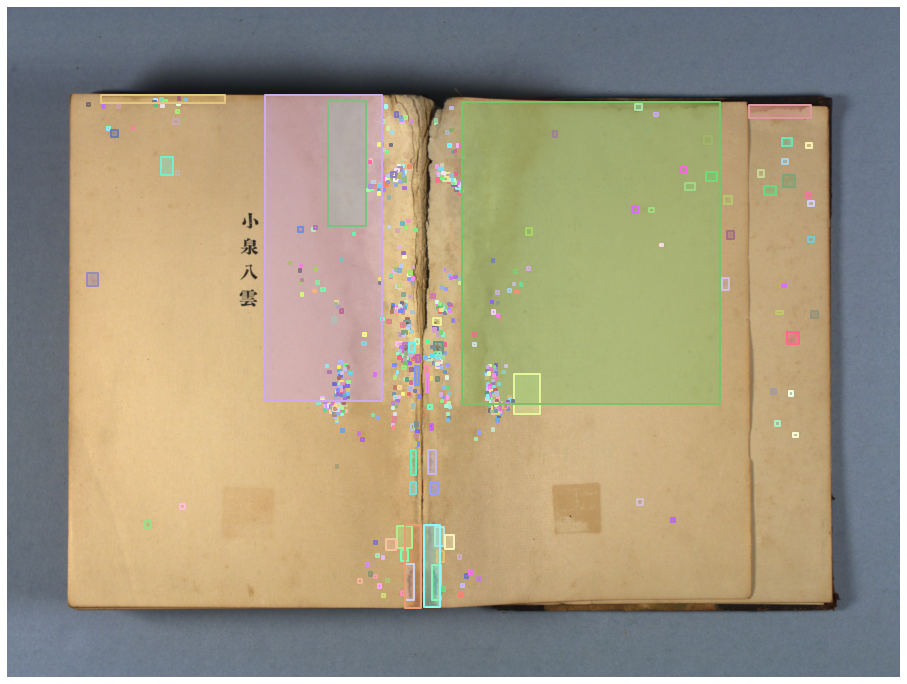

In [6]:
# annotations_file='/home/u3148947/data/nmtl/train_redo_ids_Eng.json'
annotations_file='/home/u3148947/data/nmtl/train.json'
coco=COCO(annotations_file)

# display COCO categories and supercategories
cats = coco.loadCats(coco.getCatIds())
nms=[cat['name'] for cat in cats]
print('COCO categories: \n{}\n'.format(' '.join(nms)))

nms = set([cat['supercategory'] for cat in cats])
print('COCO supercategories: \n{}'.format(' '.join(nms)))


#check length of coco ImgIds
imgIds = coco.getImgIds()#A list of id
# print(f'imgIds: {imgIds}')
print("[Total imgIds]: ", len(imgIds))

## user give ids
give_id = 36 # str(300) # or '0'
print(f'[give_id]: {give_id}')


img_infos = coco.loadImgs(imgIds)#A list of {'id': , 'width': , 'height': , 'license': , 'file_name': }
print(f'[img_infos[:5]]: {img_infos[:5]}\n')


img_info = img_infos[give_id]
print(f'[img_info]: {img_info}\n')

img_name = img_info['file_name']
print(f'[image name]: {img_name}')

img_id = img_info['id']
print(f'[img_id]: {img_id}')



# ann=coco.loadAnns(coco.getAnnIds(img_id))
# ann_ids=coco.getAnnIds('image_00000')
# print(f'\n[ann_ids[:11]]: {ann_ids[:]}')

ann=coco.loadAnns(coco.getAnnIds([img_id]))#imgIds=img_info['id']
print(f'[# of annotations in {img_name}]: {len(ann)} ')
# print(f'[ann]: {ann}')


img =  cv2.imread("/home/u3148947/data/nmtl/train/" + img_name)

#To show patchs and points  
fig = plt.figure()         
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); plt.axis('off')

coco.showAnns(ann, draw_bbox=True)

## trail 2

    seems works now

category = [WormEat, Mold, Defecation, Brown, Stains]
category = [蟲蛀, 黴菌, 生物排遺, 褐斑, 水漬]
category = [1, 2, 3, 4, 5]


loading annotations into memory...
Done (t=0.19s)
creating index...
index created!
Total images:  332
img_id: image_00300
img_id: image_00301
img_id: image_00302
img_id: image_00303
img_id: image_00304
img_id: image_00305
img_id: image_00306
img_id: image_00307
img_id: image_00308
img_id: image_00309


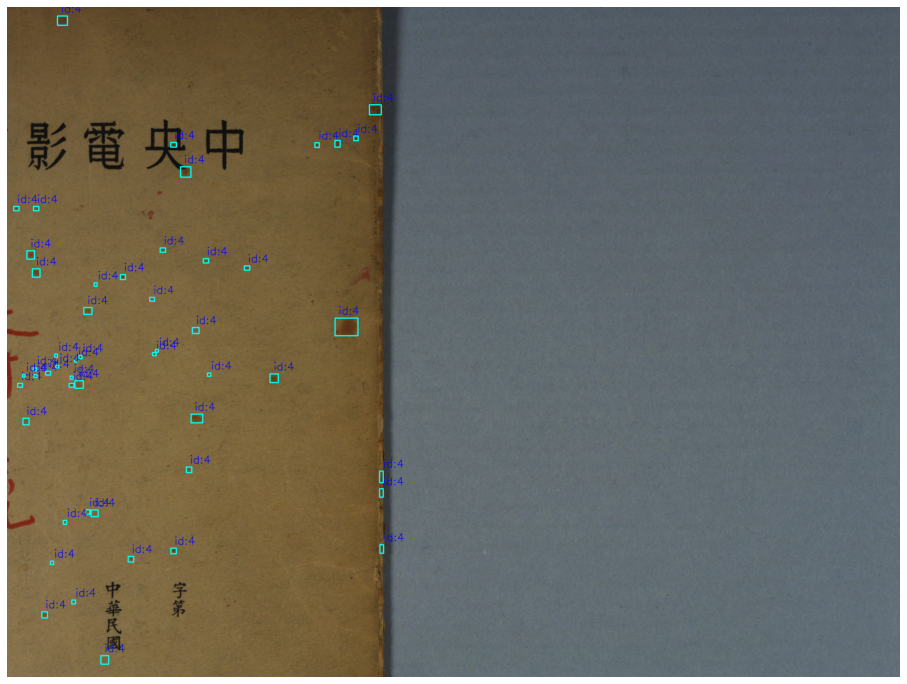

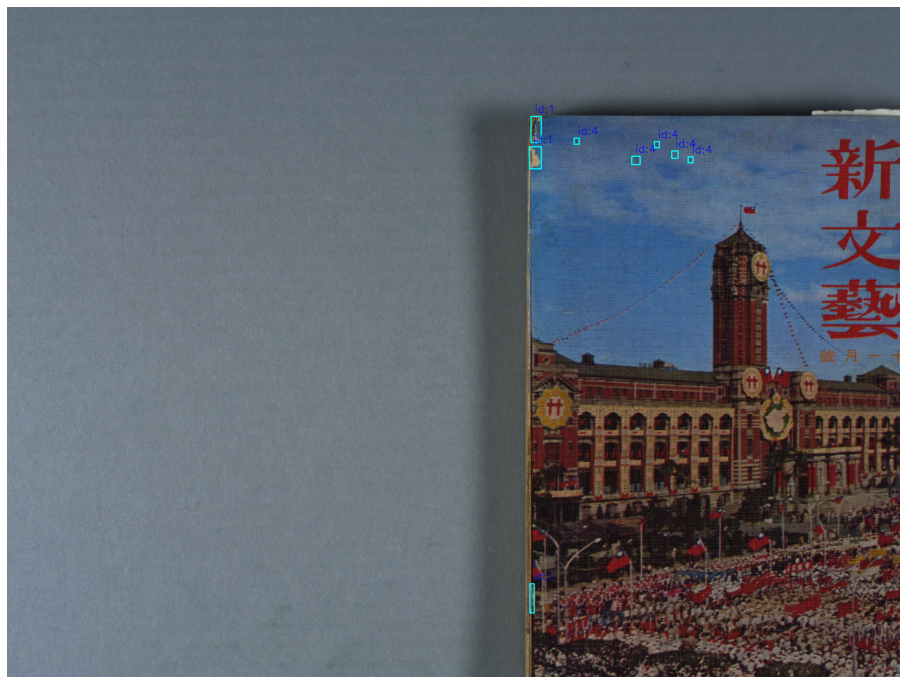

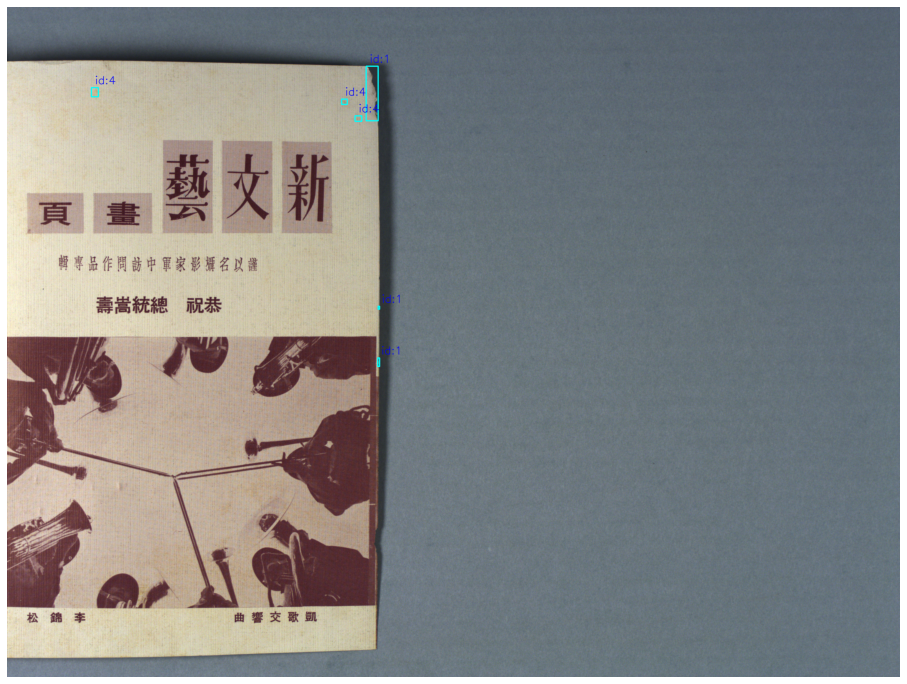

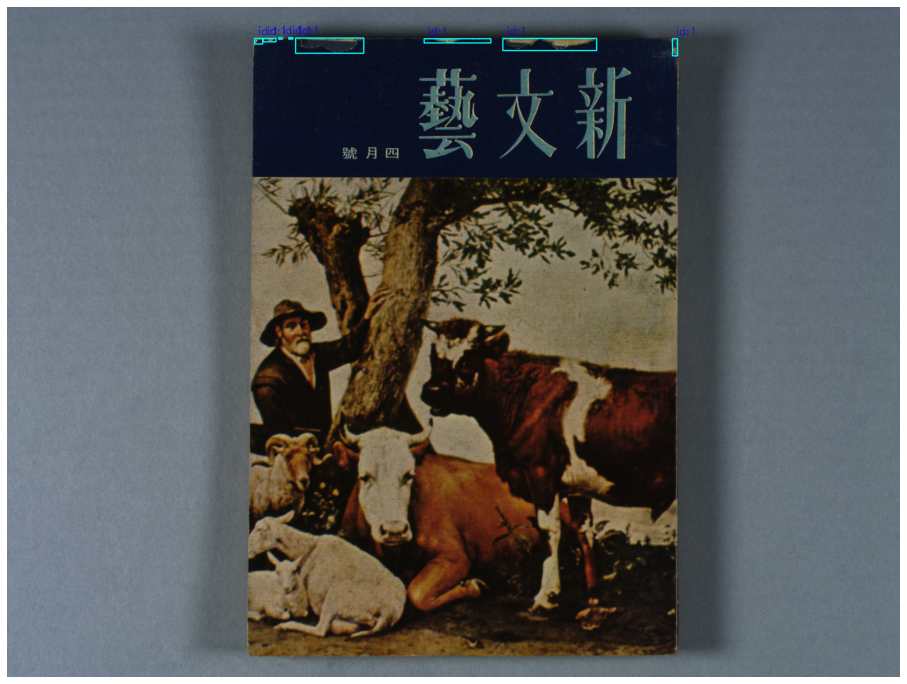

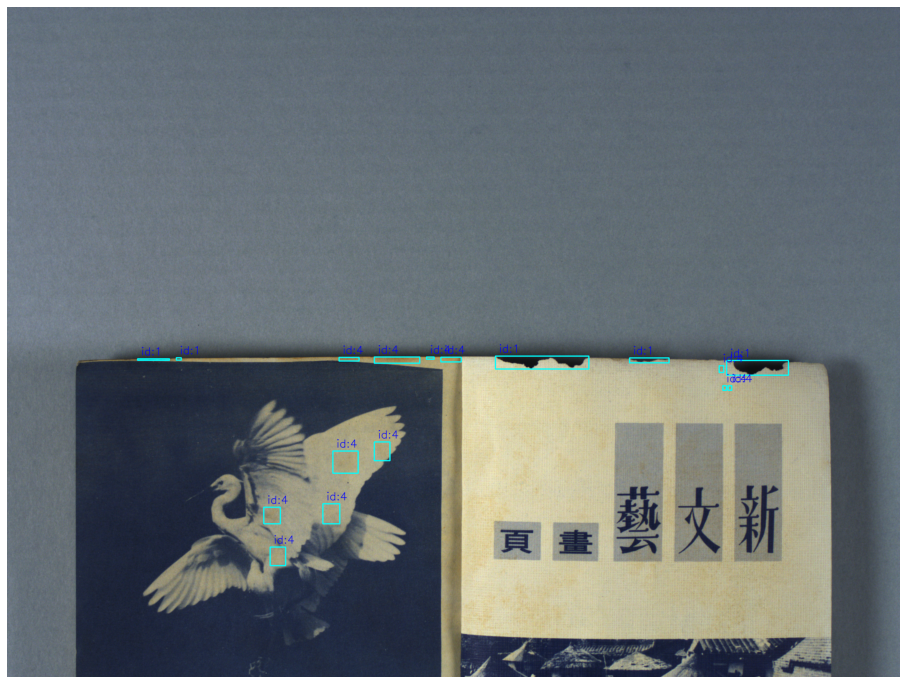

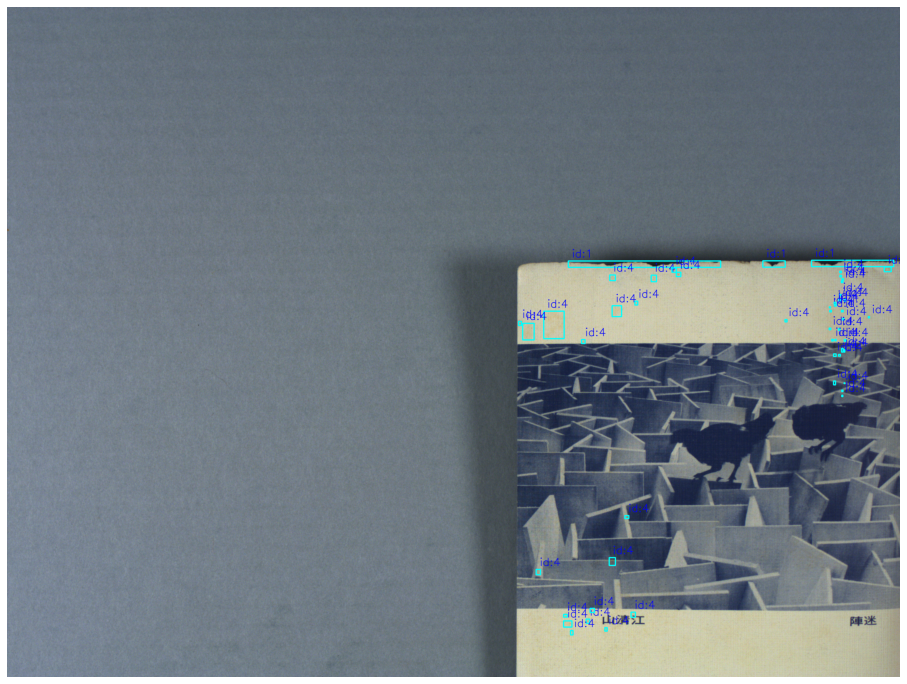

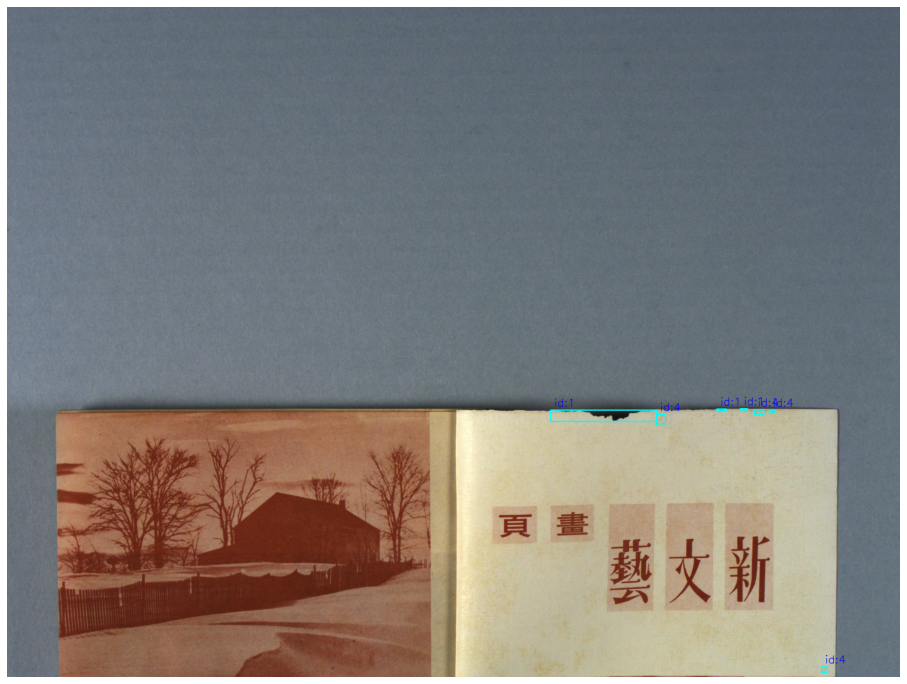

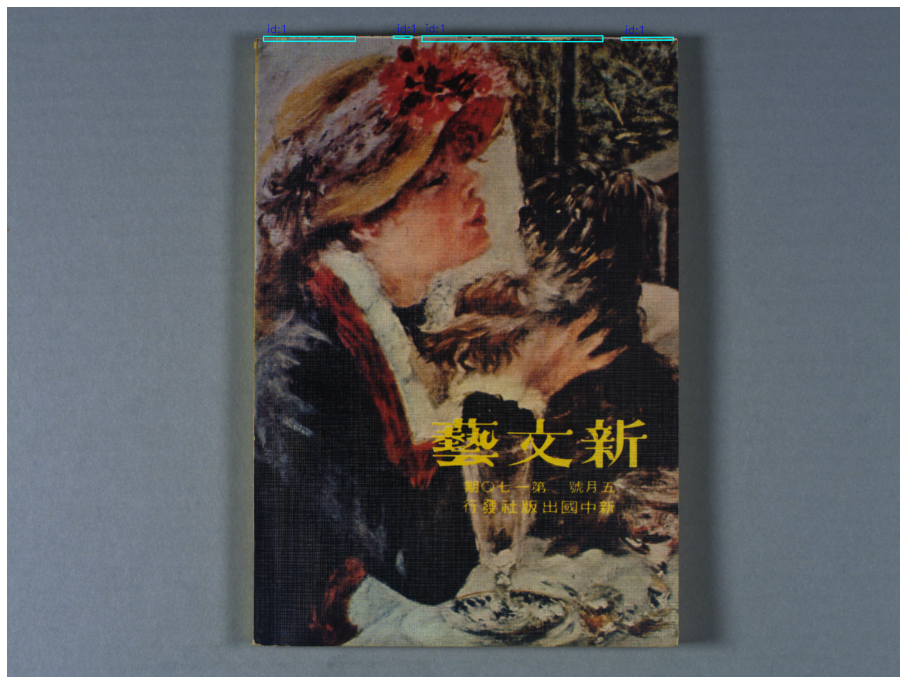

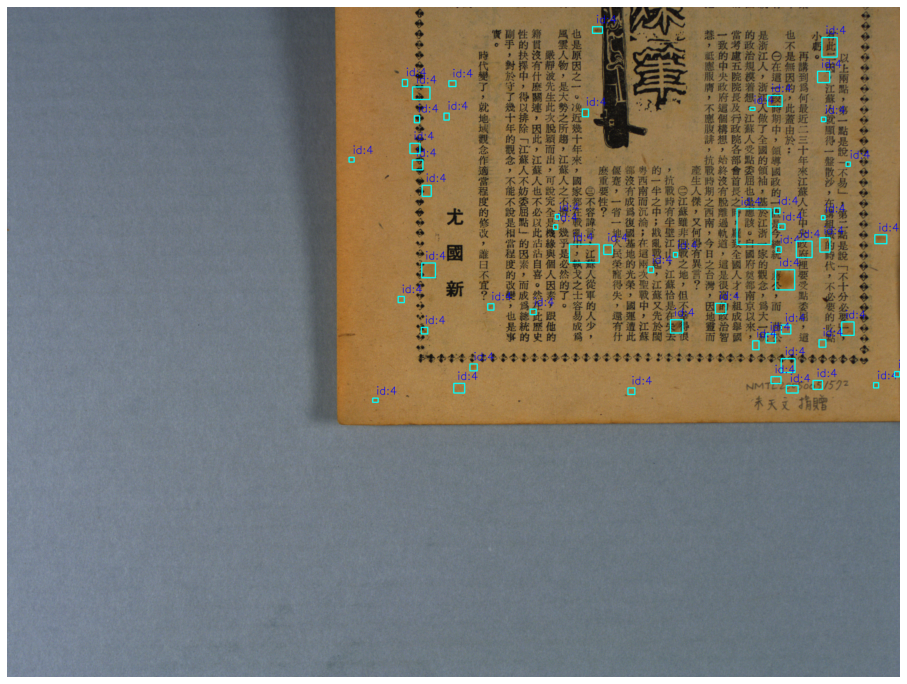

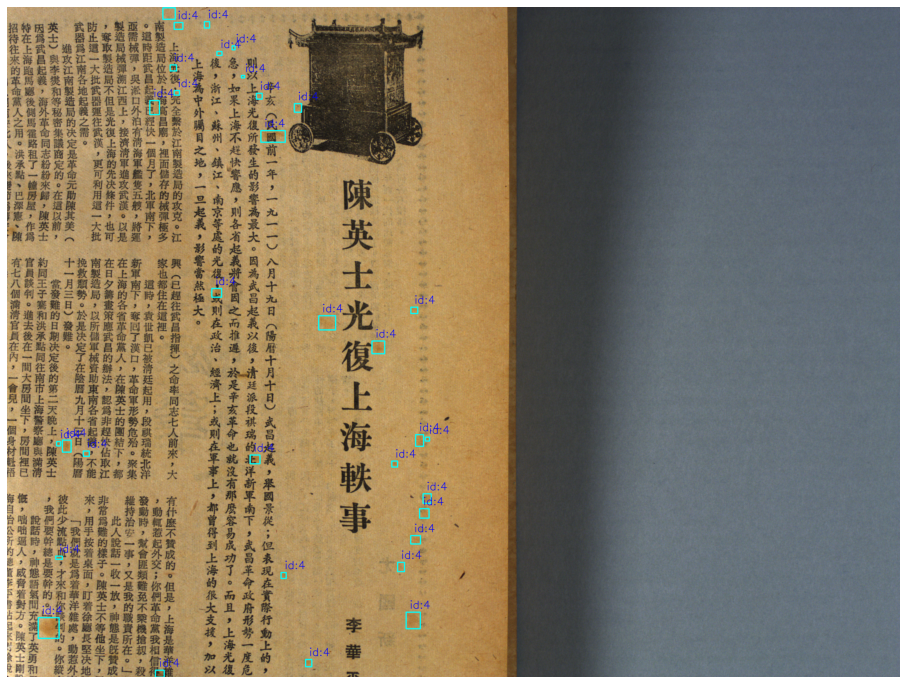

In [6]:
# annotations_file='/home/u3148947/data/nmtl/train_redo_ids_Eng.json'
annotations_file='/home/u3148947/data/nmtl/train.json'
coco=COCO(annotations_file)

#check length of coco ImgIds
imgIds = coco.getImgIds()#A list of id
# print(f'imgIds: {imgIds}')
print("Total images: ", len(imgIds))

# ## user give ids
# give_id = 0 # str(300) # or '0'
# print(f'give_id: {give_id}')

# img_info = coco.loadImgs(give_id)[0]
img_infos = coco.loadImgs(imgIds)#A list of {'id': , 'width': , 'height': , 'license': , 'file_name': }


# for nu_of_images in range(len(imgIds)):
for nu_of_images in range(300, 310):
    
    img_info = img_infos[nu_of_images]# where, the (img_infos)[give_id], give_id is indicte the image id want to get

    img_id = img_info['id']
    img_name = img_info['file_name']
    print(f'img_id: {img_id}')
    #print(f'img_info: {img_info}')
    #print(f'image name: {img_name}')

    img =  cv2.imread("/home/u3148947/data/nmtl/train/" + img_name)
    
    ann=coco.loadAnns(coco.getAnnIds([img_id]))#imgIds=img_info['id']
    #ann=coco.loadAnns(coco.getAnnIds(img_id)) #imgIds=img_info['id']
    #print(f'# of annotations in {img_name}: {len(ann)} ')
    
    #Check bbox from ann
    """OK"""
    for a in ann:
        #print(f'[A box]: {a}')
        category_id = a['category_id']
        txt = 'id:' + str(category_id)
        x,y,w,h = a['bbox']
        cv2.rectangle(img, (int(x), int(y)), (int(x+w), int(y+h)), (255, 255, 0), 5)
        cv2.putText(img=img, text=txt, org=(int(x)+20, int(y)-20), fontFace=font, fontScale=2.0, color=color, thickness=thickness, lineType=cv2.LINE_AA)

    
    fig = plt.figure()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB));plt.axis('off')
    #coco.showAnns(ann, draw_bbox=True)
    

#     plt.savefig(f'test_patchs/check_label/ck_{img_name}', bbox_inches='tight', pad_inches=0)
#     plt.close(fig) # close the figure window

# Check box size is it too small when convert to tf_rrecord

      if int(x2 - x1) < 9 or int(y2 - y1) < 9: # should check % of image not simple pixel.
        print('* * * Check WXH :', int(x2 - x1), int(y2 - y1))
        raise Exception('object too small')



In [7]:
# annotations_file='/home/u3148947/data/nmtl/train_redo_ids_Eng.json'
annotations_file='/home/u3148947/data/nmtl/train.json'
coco=COCO(annotations_file)

#check length of coco ImgIds
imgIds = coco.getImgIds()#A list of id
# print(f'imgIds: {imgIds}')
print("Total images: ", len(imgIds))

# ## user give ids
# give_id = 0 # str(300) # or '0'
# print(f'give_id: {give_id}')

# img_info = coco.loadImgs(give_id)[0]
img_infos = coco.loadImgs(imgIds)#A list of {'id': , 'width': , 'height': , 'license': , 'file_name': }

category = ['WormEat', 'Mold', 'Defecation', 'Brown', 'Stains']
print(f'category:{category}')
check_size_below = 10
too_small_bbox = 0
for nu_of_images in range(len(imgIds)):
# for nu_of_images in range(300, 310):
    
    img_info = img_infos[nu_of_images]# where, the (img_infos)[give_id], give_id is indicte the image id want to get

    img_id = img_info['id']
    img_name = img_info['file_name']
    #print(f'img_id: {img_id}')
    #print(f'img_info: {img_info}')
    #print(f'image name: {img_name}')

    #img =  cv2.imread("/home/u3148947/data/nmtl/train/" + img_name)
    
    ann=coco.loadAnns(coco.getAnnIds([img_id]))#imgIds=img_info['id']
    #ann=coco.loadAnns(coco.getAnnIds(img_id)) #imgIds=img_info['id']
    #print(f'# of annotations in {img_name}: {len(ann)} ')
    
    #Check bbox from ann
    """OK"""
    for a in ann:
        #print(f'[A box]: {a}')
        category_id = a['category_id']
        object_name = category[category_id-1]
        txt = 'id:' + str(category_id)
        x,y,w,h = a['bbox']
        
        #Check box size wxh
        if int(w) < 9 or int(h) < 9: # should check % of image not simple pixel.
            print(f'Small_box_check_WXH : {img_id} [{object_name}] [{category_id}]: {w}, {h}')
            #raise Exception('object too small')
            too_small_bbox += 1
        
        #cv2.rectangle(img, (int(x), int(y)), (int(x+w), int(y+h)), (255, 255, 0), 5)
        #cv2.putText(img=img, text=txt, org=(int(x)+20, int(y)-20), fontFace=font, fontScale=2.0, color=color, thickness=thickness, lineType=cv2.LINE_AA)

    
    #fig = plt.figure()
    #plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB));plt.axis('off')
    #coco.showAnns(ann, draw_bbox=True)
    
print(f'[#_of_too_small_bbox] {too_small_bbox}')


loading annotations into memory...
Done (t=0.19s)
creating index...
index created!
Total images:  332
category:['WormEat', 'Mold', 'Defecation', 'Brown', 'Stains']
Small_box_check_WXH : image_00036 [Mold] [2]: 7.0, 13.0
Small_box_check_WXH : image_00036 [Mold] [2]: 7.0, 10.0
Small_box_check_WXH : image_00036 [Mold] [2]: 7.0, 10.0
Small_box_check_WXH : image_00036 [Mold] [2]: 11.0, 8.0
Small_box_check_WXH : image_00036 [Mold] [2]: 11.0, 8.0
Small_box_check_WXH : image_00036 [Mold] [2]: 11.0, 8.0
Small_box_check_WXH : image_00036 [Mold] [2]: 9.0, 7.0
Small_box_check_WXH : image_00036 [Mold] [2]: 8.0, 14.0
Small_box_check_WXH : image_00036 [Mold] [2]: 8.0, 19.0
Small_box_check_WXH : image_00036 [Mold] [2]: 10.0, 7.0
Small_box_check_WXH : image_00043 [Mold] [2]: 8.0, 10.0
Small_box_check_WXH : image_00045 [Mold] [2]: 16.0, 8.0
Small_box_check_WXH : image_00045 [Mold] [2]: 8.0, 15.0
Small_box_check_WXH : image_00051 [Brown] [4]: 20.0, 7.0
Small_box_check_WXH : image_00071 [Mold] [2]: 8.0, 1